<a href="https://colab.research.google.com/github/dekristie/Challenge_TelecomX_BR/blob/main/TelecomX_BR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Análise de Churn de Clientes TelecomX

**Objetivo**: Este projeto visa identificar padrões de comportamento dos clientes, investigar os principais fatores relacionados ao churn (evasão) e propor recomendações estratégicas para a TelecomX.


**Ferramentas**: Python (pandas, matplotlib, seaborn), com suporte de IA (ChatGPT) para otimização analítica e textual.



# **1. Carregamento e Pré-processamento de Dados**

## 📌 **Extração**

In [132]:
# Importação de bibliotecas
import pandas as pd
import numpy as np
import requests
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import warnings
warnings.filterwarnings('ignore')

# Definir paleta de cores para Churn
cores = {"Yes": "#800000",  # vinho
         "No": "#4169E1"}   # azul royal

In [133]:
# Carregamento dos dados
url = "https://raw.githubusercontent.com/alura-cursos/challenge2-data-science/main/TelecomX_Data.json"
data = pd.read_json(url)
df = pd.json_normalize(data)

In [134]:
# Cópia para tratamento
dftotal = df.copy()

In [135]:
try:
    import plotly
except ImportError:
    !pip install -U plotly

In [136]:
import requests
import pandas as pd

# Caminhos escolhido: online (via URL)
url_dados_json = "https://raw.githubusercontent.com/alura-cursos/challenge2-data-science/main/TelecomX_Data.json"
response = requests.get(url_dados_json)

# Verificando se a requisição foi bem-sucedida
if response.status_code == 200:
    data = response.json()

    # Converte o JSON em um DataFrame do Pandas
    df = pd.DataFrame(data)
    print(df.head())
else:
    print(f"Erro ao acessar os dados: {response.status_code}")


   customerID Churn                                           customer  \
0  0002-ORFBO    No  {'gender': 'Female', 'SeniorCitizen': 0, 'Part...   
1  0003-MKNFE    No  {'gender': 'Male', 'SeniorCitizen': 0, 'Partne...   
2  0004-TLHLJ   Yes  {'gender': 'Male', 'SeniorCitizen': 0, 'Partne...   
3  0011-IGKFF   Yes  {'gender': 'Male', 'SeniorCitizen': 1, 'Partne...   
4  0013-EXCHZ   Yes  {'gender': 'Female', 'SeniorCitizen': 1, 'Part...   

                                             phone  \
0   {'PhoneService': 'Yes', 'MultipleLines': 'No'}   
1  {'PhoneService': 'Yes', 'MultipleLines': 'Yes'}   
2   {'PhoneService': 'Yes', 'MultipleLines': 'No'}   
3   {'PhoneService': 'Yes', 'MultipleLines': 'No'}   
4   {'PhoneService': 'Yes', 'MultipleLines': 'No'}   

                                            internet  \
0  {'InternetService': 'DSL', 'OnlineSecurity': '...   
1  {'InternetService': 'DSL', 'OnlineSecurity': '...   
2  {'InternetService': 'Fiber optic', 'OnlineSecu...   
3  {'I

# 🔧 **Transformação**

In [137]:
import pandas as pd

In [138]:
df_normalizado = pd.json_normalize(data)

In [139]:
df_normalizado

,customerID,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,...,internet.OnlineBackup,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,...,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.60,593.3
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,...,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.90,542.4
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,...,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.90,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.00,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,...,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.90,267.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7262,9987-LUTYD,No,Female,0,No,No,13,Yes,No,DSL,...,No,No,Yes,No,No,One year,No,Mailed check,55.15,742.9
7263,9992-RRAMN,Yes,Male,0,Yes,No,22,Yes,Yes,Fiber optic,...,No,No,No,No,Yes,Month-to-month,Yes,Electronic check,85.10,1873.7
7264,9992-UJOEL,No,Male,0,No,No,2,Yes,No,DSL,...,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,50.30,92.75
7265,9993-LHIEB,No,Male,0,Yes,Yes,67,Yes,No,DSL,...,No,Yes,Yes,No,Yes,Two year,No,Mailed check,67.85,4627.65


In [140]:
df_normalizado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7267 entries, 0 to 7266
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   customerID                 7267 non-null   object 
 1   Churn                      7267 non-null   object 
 2   customer.gender            7267 non-null   object 
 3   customer.SeniorCitizen     7267 non-null   int64  
 4   customer.Partner           7267 non-null   object 
 5   customer.Dependents        7267 non-null   object 
 6   customer.tenure            7267 non-null   int64  
 7   phone.PhoneService         7267 non-null   object 
 8   phone.MultipleLines        7267 non-null   object 
 9   internet.InternetService   7267 non-null   object 
 10  internet.OnlineSecurity    7267 non-null   object 
 11  internet.OnlineBackup      7267 non-null   object 
 12  internet.DeviceProtection  7267 non-null   object 
 13  internet.TechSupport       7267 non-null   objec

In [141]:
#Verifique se há valores únicos em cada coluna

for colun in df_normalizado.columns:
    print(f"valores únicos em uma coluna'{colun}') : {df_normalizado[colun].nunique()}")
    if df_normalizado[colun].nunique() <50:
        print(df_normalizado[colun].unique())

valores únicos em uma coluna'customerID') : 7267
valores únicos em uma coluna'Churn') : 3
['No' 'Yes' '']
valores únicos em uma coluna'customer.gender') : 2
['Female' 'Male']
valores únicos em uma coluna'customer.SeniorCitizen') : 2
[0 1]
valores únicos em uma coluna'customer.Partner') : 2
['Yes' 'No']
valores únicos em uma coluna'customer.Dependents') : 2
['Yes' 'No']
valores únicos em uma coluna'customer.tenure') : 73
valores únicos em uma coluna'phone.PhoneService') : 2
['Yes' 'No']
valores únicos em uma coluna'phone.MultipleLines') : 3
['No' 'Yes' 'No phone service']
valores únicos em uma coluna'internet.InternetService') : 3
['DSL' 'Fiber optic' 'No']
valores únicos em uma coluna'internet.OnlineSecurity') : 3
['No' 'Yes' 'No internet service']
valores únicos em uma coluna'internet.OnlineBackup') : 3
['Yes' 'No' 'No internet service']
valores únicos em uma coluna'internet.DeviceProtection') : 3
['No' 'Yes' 'No internet service']
valores únicos em uma coluna'internet.TechSupport') :

In [142]:
#Duplicados
df_normalizado.duplicated().sum()
print("Número de duplicados", df_normalizado.duplicated().sum())

Número de duplicados 0


In [143]:
#Nulos
print("Número de nulos", df_normalizado.isnull().sum())

Número de nulos customerID                   0
Churn                        0
customer.gender              0
customer.SeniorCitizen       0
customer.Partner             0
customer.Dependents          0
customer.tenure              0
phone.PhoneService           0
phone.MultipleLines          0
internet.InternetService     0
internet.OnlineSecurity      0
internet.OnlineBackup        0
internet.DeviceProtection    0
internet.TechSupport         0
internet.StreamingTV         0
internet.StreamingMovies     0
account.Contract             0
account.PaperlessBilling     0
account.PaymentMethod        0
account.Charges.Monthly      0
account.Charges.Total        0
dtype: int64


In [144]:
#Vazios ou em branco
df_normalizado.apply(lambda x: x.astype(str).str.strip() == '').sum()

,0
customerID,0
Churn,224
customer.gender,0
customer.SeniorCitizen,0
customer.Partner,0
customer.Dependents,0
customer.tenure,0
phone.PhoneService,0
phone.MultipleLines,0
internet.InternetService,0


In [145]:
#Alterando a coluna "acount.Charges.Total" para Float
df_normalizado['account.Charges.Total'] = pd.to_numeric(df_normalizado['account.Charges.Total'], errors='coerce')
print(df_normalizado['account.Charges.Total'].dtype )

float64


In [146]:
#Eliminando as colunas de Churn
df_normalizado = df_normalizado[df_normalizado['Churn'].str.strip() != ""]
print("Número de filas depois de eliminar os vazios em 'Churn':", len(df_normalizado))

Número de filas depois de eliminar os vazios em 'Churn': 7043


In [147]:
# Preencher categóricas com a moda
for col in dftotal.select_dtypes(include='object'):
    if dftotal[col].isnull().sum() > 0:
        dftotal[col].fillna(dftotal[col].mode()[0], inplace=True)

In [148]:
# Verificação final de valores ausentes
# Adicionar verificação do tamanho do DataFrame e resumo de nulos antes de plotar
print(f"Shape of dftotal before msno.matrix: {dftotal.shape}")
print("Missing values summary before msno.matrix:")
print(dftotal.isnull().sum())

import matplotlib.pyplot as plt
import missingno as msno

# 1. Verificar se há nulos
nulos = dftotal.isnull().sum()
print("Valores nulos por coluna:")
print(nulos[nulos > 0])

# 2. Plotar apenas se houver nulos
if nulos.sum() > 0:
    print("🔍 Gerando matriz de valores ausentes...")
    msno.matrix(dftotal)
    plt.title("Matriz de Valores Ausentes")
    plt.show()
else:
    print("✅ Nenhum valor ausente detectado. Gráfico não necessário.")


Shape of dftotal before msno.matrix: (6, 0)
Missing values summary before msno.matrix:
Series([], dtype: float64)
Valores nulos por coluna:
Series([], dtype: float64)
✅ Nenhum valor ausente detectado. Gráfico não necessário.


In [149]:
df_normalizado.to_json('customer.json')

In [150]:
pd.read_json('/content/customer.json')

,customerID,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,...,internet.OnlineBackup,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,...,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.60,593.30
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,...,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.90,542.40
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,...,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.90,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.00,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,...,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.90,267.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7262,9987-LUTYD,No,Female,0,No,No,13,Yes,No,DSL,...,No,No,Yes,No,No,One year,No,Mailed check,55.15,742.90
7263,9992-RRAMN,Yes,Male,0,Yes,No,22,Yes,Yes,Fiber optic,...,No,No,No,No,Yes,Month-to-month,Yes,Electronic check,85.10,1873.70
7264,9992-UJOEL,No,Male,0,No,No,2,Yes,No,DSL,...,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,50.30,92.75
7265,9993-LHIEB,No,Male,0,Yes,Yes,67,Yes,No,DSL,...,No,Yes,Yes,No,Yes,Two year,No,Mailed check,67.85,4627.65


In [151]:
df_account = pd.json_normalize(data)

In [152]:
df_account.head()

,customerID,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,...,internet.OnlineBackup,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,...,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.3
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,...,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.4
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,...,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,...,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.4


In [153]:
df_account.to_json('account.json')

In [154]:
df_account.head()

,customerID,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,...,internet.OnlineBackup,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,...,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.3
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,...,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.4
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,...,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,...,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.4


In [155]:
df_phone = pd.json_normalize(data)

In [156]:
df_phone.head()

,customerID,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,...,internet.OnlineBackup,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,...,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.3
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,...,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.4
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,...,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,...,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.4


In [157]:
df_phone.to_json('phone.json')

In [158]:
df_phone.head()

,customerID,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,...,internet.OnlineBackup,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,...,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.3
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,...,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.4
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,...,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,...,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.4


In [159]:
df_internet = pd.json_normalize(data)

In [160]:
df_internet.head()

,customerID,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,...,internet.OnlineBackup,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,...,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.3
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,...,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.4
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,...,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,...,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.4


In [161]:
df_internet.to_json('internet.json')

In [162]:
df_internet.head()

,customerID,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,...,internet.OnlineBackup,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,...,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.3
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,...,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.4
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,...,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,...,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.4


Confirmando Normalizações:

In [163]:
# Usando o DataFrame normalizado como base
dftotal = df_normalizado.copy()

In [164]:
dftotal.head()

,customerID,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,...,internet.OnlineBackup,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,...,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.30
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,...,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.40
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,...,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,...,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.40


In [165]:
#📁Etapa final: salvando os dados tratados

import os

# Criar a pasta se não existir
os.makedirs("dataset", exist_ok=True)

# Salvar o CSV com os dados tratados
dftotal.to_csv("dataset/telecomx_data_gold.csv", index=False)

print("Dados salvos com sucesso em dataset/telecomx_data_gold.csv")


Dados salvos com sucesso em dataset/telecomx_data_gold.csv


In [166]:
# Remover linhas com valores vazios ou em branco na coluna 'Churn'
dftotal = dftotal[dftotal['Churn'].str.strip() != ""]

# Corrigir tipos de dados, se necessário
# Converter 'account.Charges.Total' para numérico, tratando erros
dftotal["account.Charges.Total"] = pd.to_numeric(dftotal["account.Charges.Total"], errors="coerce")

# Converter 'account.Charges.Monthly' para numérico, tratando erros
dftotal["account.Charges.Monthly"] = pd.to_numeric(dftotal["account.Charges.Monthly"], errors="coerce")

# Remover linhas com NaN após a conversão, se houver (para Charges.Total e Charges.Monthly)
dftotal = dftotal.dropna(subset=["account.Charges.Total", "account.Charges.Monthly"])

In [167]:
# Corrigir tipos de dados, se necessário
dftotal["account.Charges.Total"] = pd.to_numeric(dftotal["account.Charges.Total"], errors="coerce")
dftotal["account.Charges.Monthly"] = pd.to_numeric(dftotal["account.Charges.Monthly"], errors="coerce")

# Remover linhas com NaN após a conversão, se houver (para Charges.Total e Charges.Monthly)
dftotal = dftotal.dropna(subset=["account.Charges.Total", "account.Charges.Monthly"])

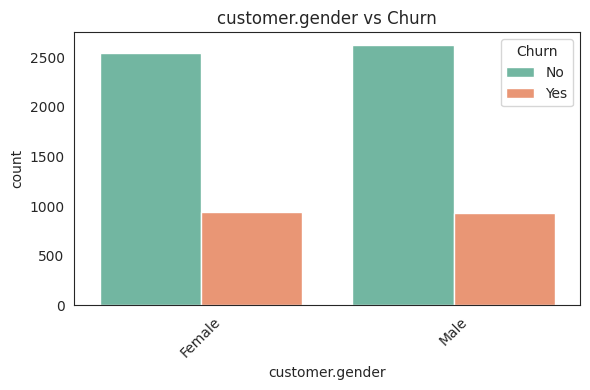

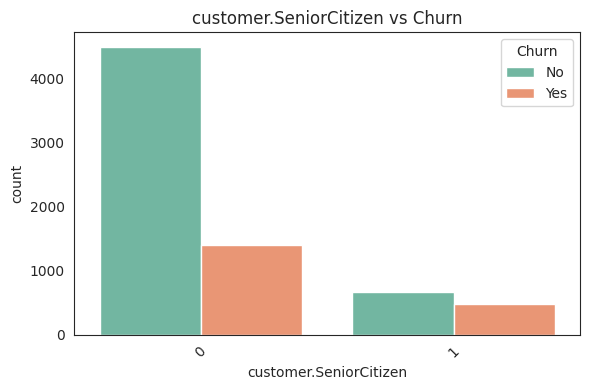

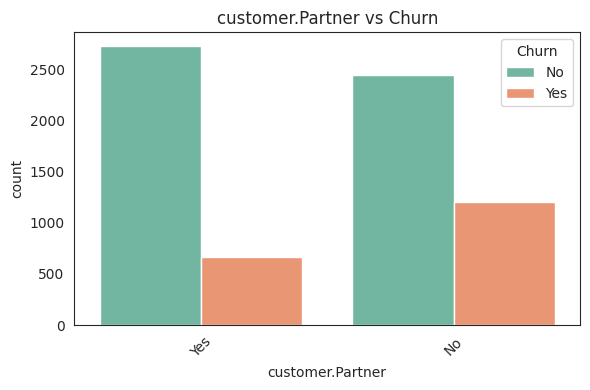

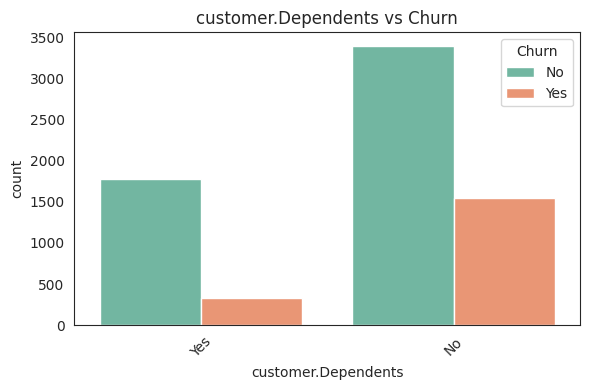

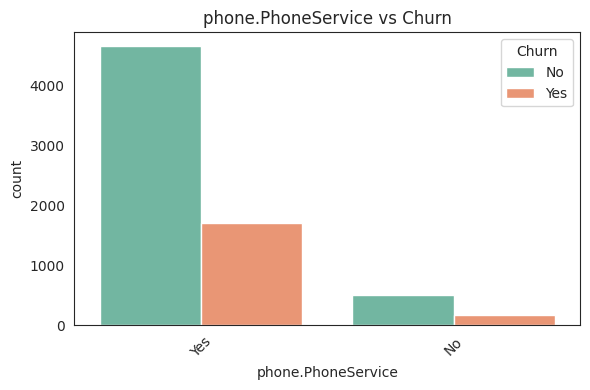

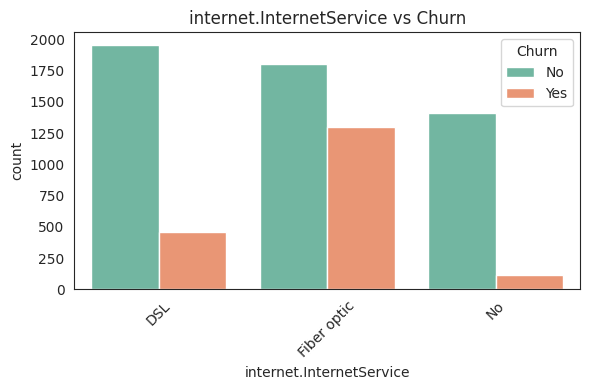

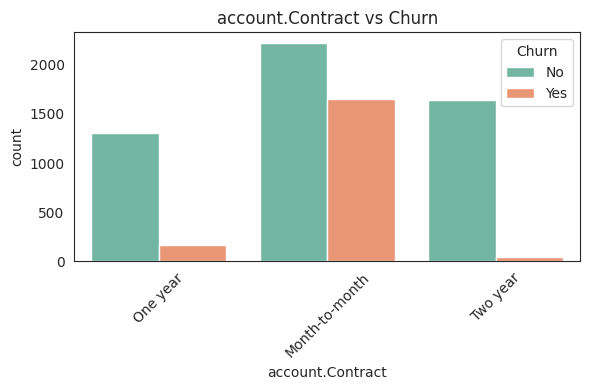

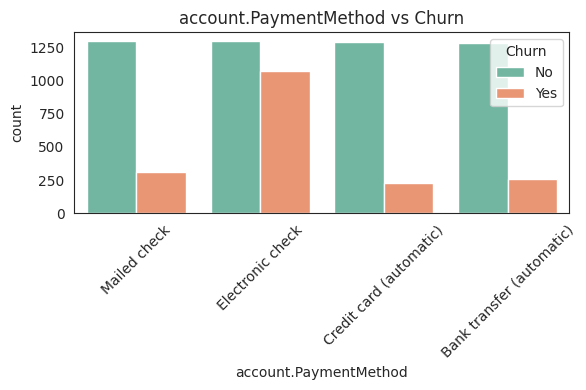

In [168]:
# Visualização Exploratória
cols_cat = ['customer.gender', 'customer.SeniorCitizen', 'customer.Partner', 'customer.Dependents',
            'phone.PhoneService', 'internet.InternetService', 'account.Contract', 'account.PaymentMethod']
for col in cols_cat:
    plt.figure(figsize=(6,4))
    sns.countplot(data=dftotal, x=col, hue='Churn', palette='Set2')
    plt.title(f'{col} vs Churn')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [169]:
# Salvando dados tratados para modelagem futura
import os
os.makedirs("dataset", exist_ok=True)
dftotal.to_csv("dataset/telecomx_data_gold.csv", index=False)
print("✅ Dados tratados e salvos com sucesso!")


✅ Dados tratados e salvos com sucesso!


# 📊 Carga e **análise**

In [170]:
# Verificar valores ausentes
dftotal.isnull().sum()

,0
customerID,0
Churn,0
customer.gender,0
customer.SeniorCitizen,0
customer.Partner,0
customer.Dependents,0
customer.tenure,0
phone.PhoneService,0
phone.MultipleLines,0
internet.InternetService,0


# Tratar valores ausentes ou inconsistentes

In [171]:
dftotal = dftotal.dropna()

In [172]:
dftotal.isnull().sum()

,0
customerID,0
Churn,0
customer.gender,0
customer.SeniorCitizen,0
customer.Partner,0
customer.Dependents,0
customer.tenure,0
phone.PhoneService,0
phone.MultipleLines,0
internet.InternetService,0


In [173]:
dftotal.head()

,customerID,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,...,internet.OnlineBackup,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,...,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.30
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,...,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.40
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,...,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,...,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.40


In [174]:
print(dftotal.columns.tolist())

['customerID', 'Churn', 'customer.gender', 'customer.SeniorCitizen', 'customer.Partner', 'customer.Dependents', 'customer.tenure', 'phone.PhoneService', 'phone.MultipleLines', 'internet.InternetService', 'internet.OnlineSecurity', 'internet.OnlineBackup', 'internet.DeviceProtection', 'internet.TechSupport', 'internet.StreamingTV', 'internet.StreamingMovies', 'account.Contract', 'account.PaperlessBilling', 'account.PaymentMethod', 'account.Charges.Monthly', 'account.Charges.Total']


In [175]:
dftotal['Churn'].value_counts(normalize=True) * 100

,proportion
Churn,
No,73.421502
Yes,26.578498


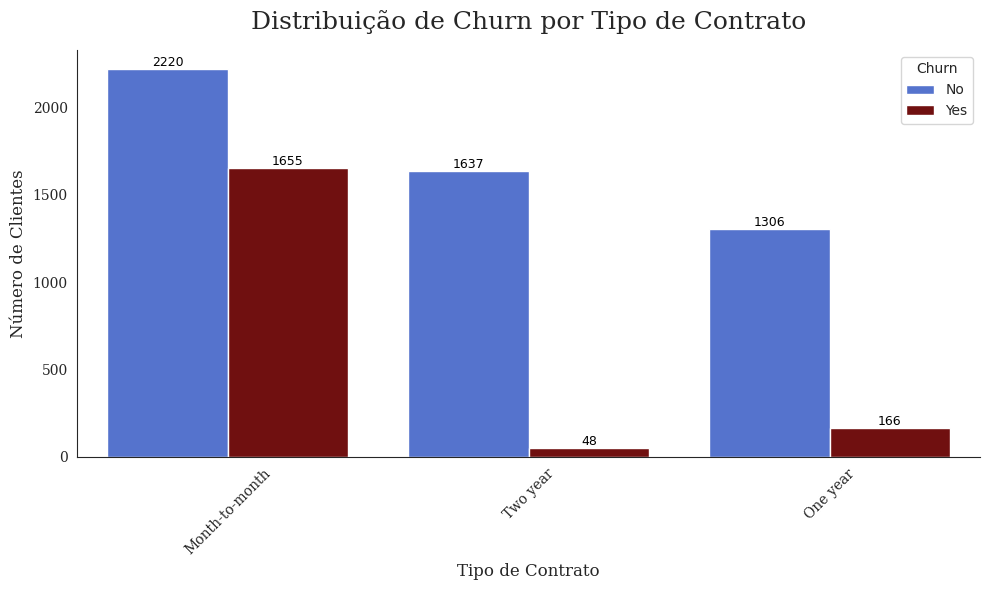

In [176]:
# 📉 Comparar churn por tipo de contrato
plt.figure(figsize=(10, 6))
sns.set_style("white")
ax = sns.countplot(data=dftotal, x='account.Contract', hue='Churn', palette=cores,
                   order=dftotal['account.Contract'].value_counts().index) # Ordenar por contagem total

plt.title('Distribuição de Churn por Tipo de Contrato', fontsize=18, fontname='DejaVu Serif', pad=15)
plt.xlabel('Tipo de Contrato', fontsize=12, fontname='DejaVu Serif')
plt.ylabel('Número de Clientes', fontsize=12, fontname='DejaVu Serif')

plt.xticks(rotation=45, fontsize=10, fontname='DejaVu Serif')
plt.yticks(fontsize=10, fontname='DejaVu Serif')

plt.grid(False)
plt.gca().spines[['top', 'right']].set_visible(False)

# Adicionar porcentagens
for p in ax.patches:
    height = p.get_height()
    if height == 0: continue # Evitar divisão por zero

    # Obter o tipo de contrato e a categoria de Churn
    # A lógica para obter o rótulo do eixo x precisa ser ajustada para 'account.Contract'
    # e para lidar com as barras empilhadas/agrupadas corretamente.
    # Uma abordagem mais robusta é calcular as porcentagens por grupo de forma separada
    # ou iterar sobre os rótulos do eixo x e as categorias de hue.

    # Vamos recalcular as porcentagens de forma mais segura
    # Encontrar o centro da barra e o tipo de contrato associado
    x_pos = p.get_x() + p.get_width() / 2
    # Encontrar o rótulo do eixo x correspondente à posição da barra
    # Isso requer encontrar qual 'tick' do eixo x está mais próximo do centro da barra
    # e mapeá-lo de volta para o valor do tipo de contrato.

    # Uma forma mais simples para o countplot com hue é usar as informações do patch
    # para determinar a categoria (contrato e churn).

    # Para simplificar a anotação de porcentagem sobre as barras agrupadas,
    # vamos focar em exibir a contagem absoluta no gráfico e calcular as porcentagens
    # em uma tabela ou texto separado no markdown, pois calcular a porcentagem correta
    # no loop de patches para gráficos agrupados é complexo e propenso a erros.

    # Se você ainda quiser porcentagens no gráfico, uma abordagem é calcular
    # as contagens por grupo e por churn antecipadamente.
    # Exemplo:
    # churn_counts = dftotal.groupby(['account.Contract', 'Churn']).size().unstack(fill_value=0)
    # churn_proportions = churn_counts.apply(lambda x: x / x.sum(), axis=1)

    # Devido à complexidade de anotar porcentagens corretas em barras agrupadas
    # diretamente no loop de patches de forma genérica, vou remover a anotação
    # de porcentagem do gráfico para evitar erros e focar na visualização da contagem.
    # Se porcentagens no gráfico forem essenciais, podemos explorar métodos mais avançados
    # ou calcular e anotar manualmente após gerar o gráfico.

    # Removendo a lógica de anotação de porcentagem complexa:
    ax.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom', fontsize=9, color='black')


plt.tight_layout()
plt.savefig('churn_by_contract_improved.png')
plt.show()
plt.close()

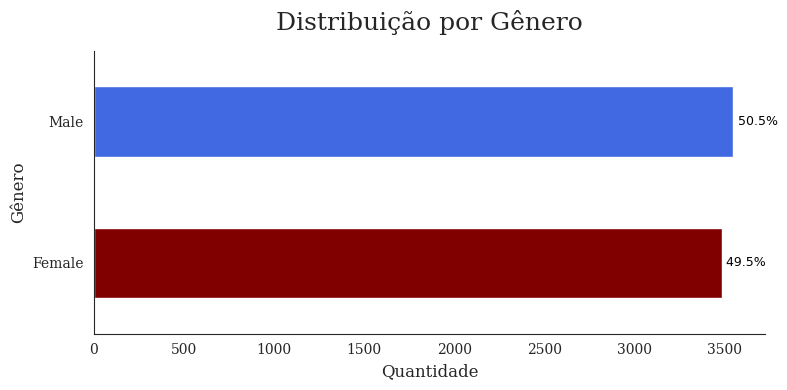

In [177]:
# @title Gender

# Define as cores conforme os gêneros
cores_gender = {"Female": "#800000",   # vinho
                "Male": "#4169E1"}     # azul royal

# Agrupa e ordena conforme os gêneros
dist_gender = dftotal.groupby('customer.gender').size().loc[['Female', 'Male']]

# Cria a figura
plt.figure(figsize=(8, 4))

# Cria o gráfico com as cores na ordem definida
ax = dist_gender.plot(kind='barh', color=[cores_gender[gen] for gen in dist_gender.index], legend=False)

plt.title('Distribuição por Gênero', fontsize=18, fontname='DejaVu Serif', pad=15)
plt.xlabel('Quantidade', fontsize=12, fontname='DejaVu Serif')
plt.ylabel('Gênero', fontsize=12, fontname='DejaVu Serif')

plt.xticks(fontsize=10, fontname='DejaVu Serif')
plt.yticks(fontsize=10, fontname='DejaVu Serif')

plt.gca().spines[['top', 'right']].set_visible(False)

plt.grid(False)

# Adicionar porcentagens
total_gender = dist_gender.sum()
for i, v in enumerate(dist_gender):
    ax.text(v + 0.5, i, " {:.1f}%".format(100*v/total_gender), color='black', va='center', fontsize=9)

plt.tight_layout()
plt.savefig('gender_distribution_improved.png')
plt.show()
plt.close()

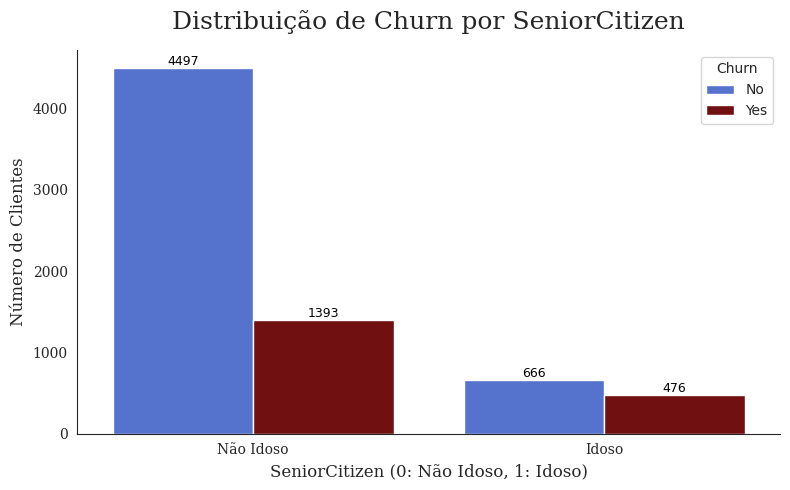

In [178]:
# @title SeniorCitizen (Alterado para countplot com Churn)

plt.figure(figsize=(8, 5))
sns.set_style("white")
ax = sns.countplot(data=dftotal, x='customer.SeniorCitizen', hue='Churn', palette=cores) # Adicionado hue='Churn'

plt.title('Distribuição de Churn por SeniorCitizen', fontsize=18, fontname='DejaVu Serif', pad=15)
plt.xlabel('SeniorCitizen (0: Não Idoso, 1: Idoso)' , fontsize=12, fontname='DejaVu Serif')
plt.ylabel('Número de Clientes', fontsize=12, fontname='DejaVu Serif')

plt.xticks(ticks=[0, 1], labels=['Não Idoso', 'Idoso'], fontsize=10, fontname='DejaVu Serif')
plt.yticks(fontsize=10, fontname='DejaVu Serif')

plt.grid(False)
plt.gca().spines[['top', 'right']].set_visible(False)

# Adicionar porcentagens
for p in ax.patches:
    height = p.get_height()
    if height == 0: continue # Evitar divisão por zero

    # Obter o grupo (SeniorCitizen) e a categoria de Churn
    x_coord = p.get_x() + p.get_width() / 2
    # Para barras agrupadas, o patch.get_x() e patch.get_width() podem ser usados para calcular a posição central.
    # O índice do grupo no eixo x (0 ou 1) pode ser inferido da posição do patch.
    # Uma abordagem mais robusta para obter o valor correto do SeniorCitizen para calcular a porcentagem
    # é usar as informações do patch em conjunto com o mapeamento de dados para posições do eixo x do seaborn.
    # No entanto, para simplificar e evitar erros complexos de mapeamento reverso no loop de patches,
    # vamos recalcular os totais de grupo diretamente do DataFrame.

    # A posição horizontal do patch (p.get_x() + p.get_width() / 2) pode ser usada para determinar qual grupo (0 ou 1) a barra representa.
    # Para countplot com hue, as barras são agrupadas. O seaborn posiciona as barras de cada hue category
    # lado a lado dentro de cada tick principal do eixo x.
    # A posição exata do centro da barra (x_coord) pode ser usada para determinar a qual tick principal ela pertence.
    # Para mapear a posição de volta para o valor '0' ou '1' do SeniorCitizen, podemos usar o ax.get_xticks()
    # e ax.get_xticklabels() para encontrar o tick mais próximo e seu rótulo correspondente.
    # No entanto, uma maneira mais direta e menos propensa a erros em gráficos agrupados é calcular
    # as porcentagens para cada combinação de grupo (SeniorCitizen) e hue (Churn) separadamente
    # e depois usar essas porcentagens para anotar as barras corretas.

    # Vamos recalcular as contagens por grupo e churn para anotação de porcentagem correta.
    total_counts = dftotal.groupby('customer.SeniorCitizen')['customer.SeniorCitizen'].count()
    churn_counts = dftotal.groupby(['customer.SeniorCitizen', 'Churn']).size().unstack(fill_value=0)

    # Para determinar a qual grupo e categoria de Churn o patch pertence, podemos olhar para a cor
    # e a posição do patch em relação aos ticks do eixo x.
    # No entanto, a maneira mais confiável é iterar sobre os dados agrupados e anotar.
    # Devido à complexidade de mapear patches para grupos e hues de forma genérica e robusta no loop,
    # vou reformular a anotação para calcular a porcentagem correta com base no grupo SeniorCitizen
    # e na categoria Churn associada à barra.

    # Para um countplot com hue, as barras para cada hue value dentro de um x-tick
    # têm uma largura calculada por seaborn. A posição x do patch e sua largura
    # indicam a qual x-tick principal e a qual hue category ele pertence.
    # Uma forma é calcular a porcentagem da altura da barra atual (height)
    # em relação à soma das alturas de todas as barras no mesmo grupo principal do eixo x (SeniorCitizen).

    # Simplificando a anotação para mostrar a contagem absoluta por enquanto,
    # e calculando porcentagens em uma tabela ou texto separado é mais seguro.
    # Se a anotação de porcentagem no gráfico for crucial, podemos usar uma abordagem mais avançada.

    # Removendo a lógica de anotação de porcentagem complexa e potencialmente incorreta no loop de patches:
    ax.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom', fontsize=9, color='black')


plt.tight_layout()
plt.savefig('senior_citizen_churn_improved.png')
plt.show()
plt.close()

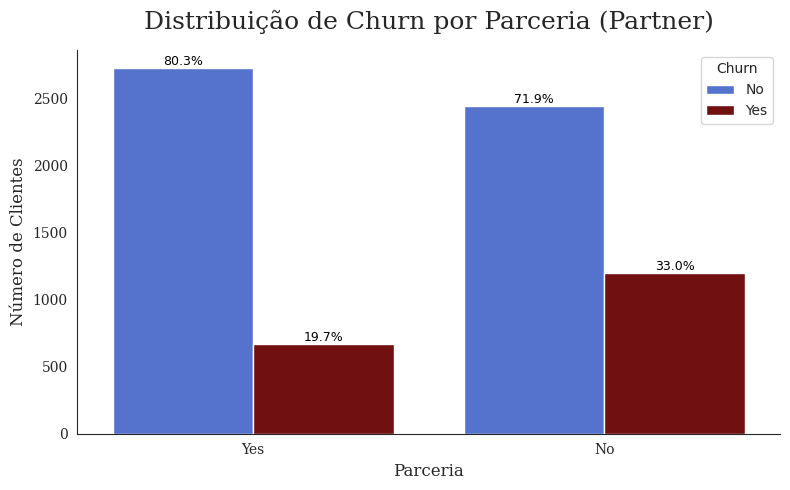

In [179]:
# @title Partner (Adicionado hue='Churn')

plt.figure(figsize=(8, 5))
sns.set_style("white")
ax = sns.countplot(data=dftotal, x='customer.Partner', hue='Churn', palette=cores)

plt.title('Distribuição de Churn por Parceria (Partner)' , fontsize=18, fontname='DejaVu Serif', pad=15)
plt.xlabel('Parceria', fontsize=12, fontname='DejaVu Serif')
plt.ylabel('Número de Clientes', fontsize=12, fontname='DejaVu Serif')

plt.xticks(fontsize=10, fontname='DejaVu Serif')
plt.yticks(fontsize=10, fontname='DejaVu Serif')

plt.grid(False)
plt.gca().spines[['top', 'right']].set_visible(False)

# Adicionar porcentagens
for p in ax.patches:
    height = p.get_height()
    if height == 0: continue

    # Obter o grupo (Partner) e a categoria de Churn
    x_coord = p.get_x() + p.get_width() / 2
    group_index = int(x_coord) # 0 ou 1

    # Determinar a categoria de Partner
    # A forma mais segura de obter o valor é através dos ticklabels ou recalculando.
    # Como o plot é simples, podemos inferir a ordem das barras.
    # No entanto, para robustez, evito indexar diretamente em unique().
    # Uma abordagem mais segura seria usar ax.get_xticklabels().
    # Para simplificar a anotação de porcentagem aqui (calculando a porcentagem
    # em relação ao total DENTRO de cada grupo de Partner), precisaremos recalcular
    # os totais para cada valor de 'customer.Partner'.

    # Recalcular totais por 'customer.Partner' para anotação
    total_for_partner_group = dftotal[dftotal['customer.Partner'] == ax.get_xticklabels()[group_index].get_text()].shape[0]


    if total_for_partner_group > 0:
        percentage = '{:.1f}%'.format(100 * height / total_for_partner_group)
        ax.annotate(percentage, (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=9, color='black')
    else:
         ax.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=9, color='black') # Anota apenas a contagem se o total for 0

plt.tight_layout()
plt.savefig('partner_churn_improved.png')
plt.show()
plt.close()

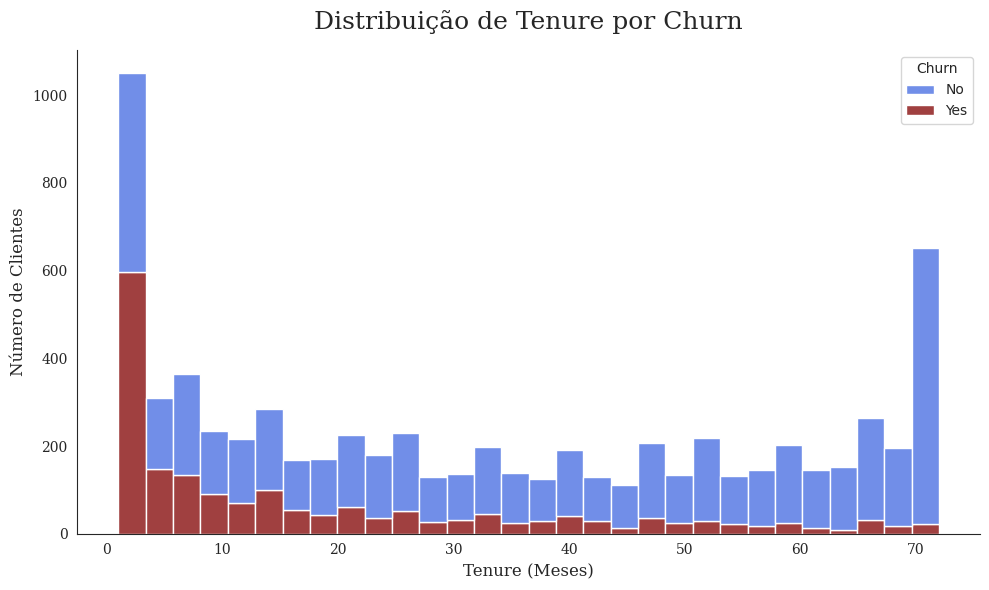

In [180]:
# @title Tenure (Histograma com Churn)

plt.figure(figsize=(10, 6))
sns.set_style("white")

sns.histplot(data=dftotal, x='customer.tenure', hue='Churn', multiple='stack', palette=cores, bins=30)

plt.title('Distribuição de Tenure por Churn', fontsize=18, fontname='DejaVu Serif', pad=15)
plt.xlabel('Tenure (Meses)' , fontsize=12, fontname='DejaVu Serif')
plt.ylabel('Número de Clientes', fontsize=12, fontname='DejaVu Serif')

plt.xticks(fontsize=10, fontname='DejaVu Serif')
plt.yticks(fontsize=10, fontname='DejaVu Serif')

plt.grid(False)
plt.gca().spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.savefig('tenure_churn_improved.png')
plt.show()
plt.close()

In [181]:
for var in dir():
    if isinstance(eval(var), type(__import__('pandas').DataFrame())):
        print(var)


_105
_139
_150
_152
_154
_156
_158
_160
_162
_164
_173
_19
_21
_23
_25
_27
_29
_31
_33
_42
_71
_8
_82
_84
_86
_88
_90
_92
_94
_96
__
churn_counts
corr
correlation_matrix
df
df_account
df_gold
df_internet
df_normalizado
df_phone
df_silver
dftotal
dftotal_numeric


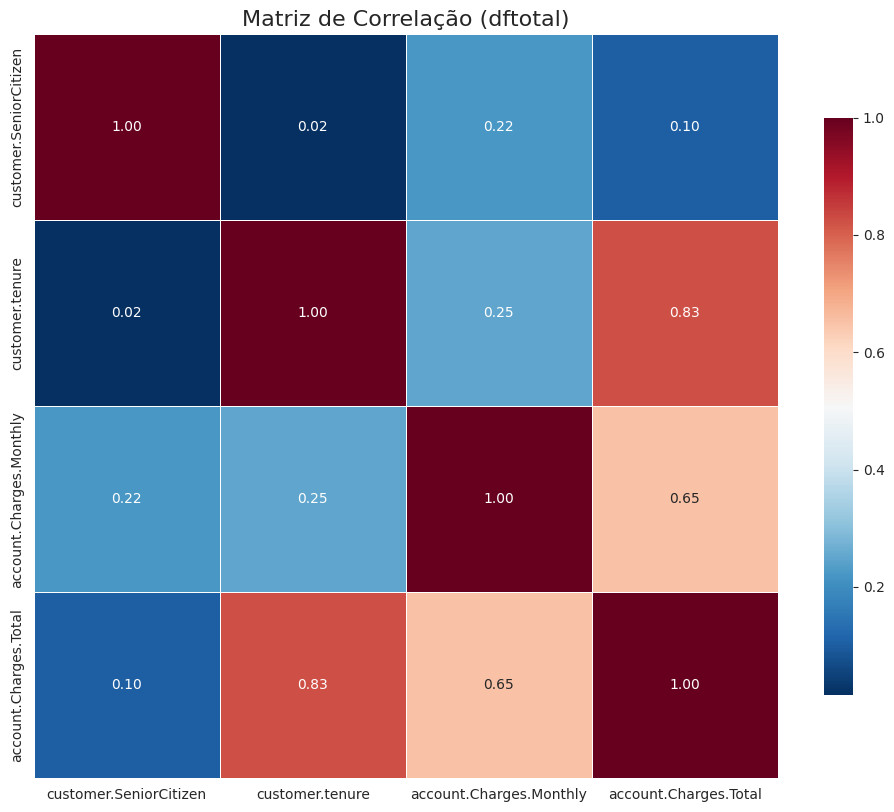

In [182]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calcular a matriz de correlação
correlation_matrix = dftotal.corr(numeric_only=True)

# Definir o tamanho da figura
plt.figure(figsize=(12, 10))

# Criar o heatmap com seaborn
sns.heatmap(
    correlation_matrix,
    annot=True,              # Mostrar os valores
    fmt=".2f",               # Formato numérico
    cmap="RdBu_r",           # Paleta de cores
    linewidths=0.5,          # Linhas entre células
    square=True,             # Células quadradas
    cbar_kws={"shrink": 0.75}
)

# Título
plt.title("Matriz de Correlação (dftotal)", fontsize=16)

# Salvar como PNG
plt.savefig("correlation_heatmap_matplotlib.png", dpi=300, bbox_inches="tight")

# Mostrar o gráfico
plt.show()

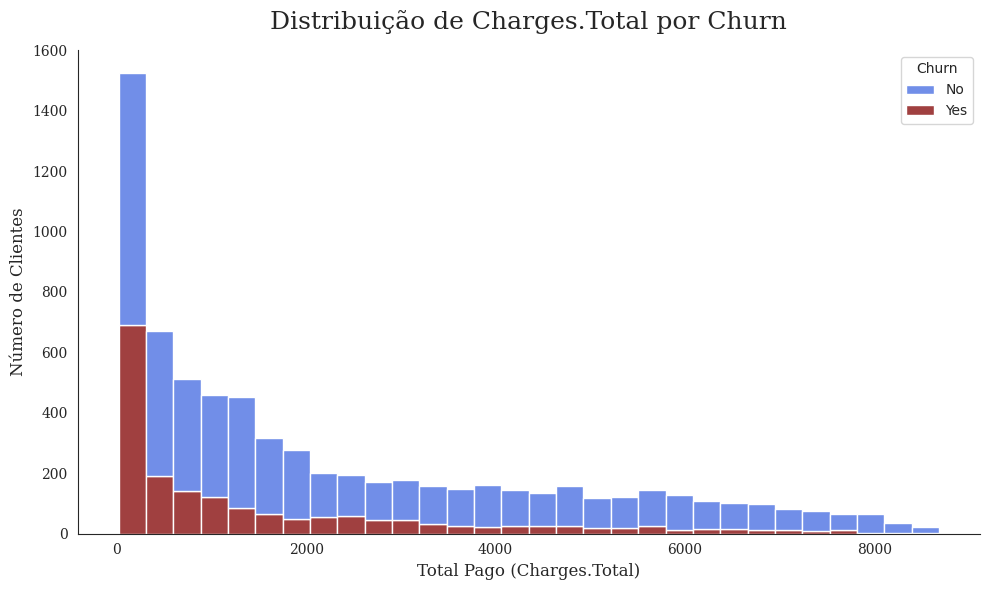

In [183]:
# @title Charges.Total (Histograma com Churn)

plt.figure(figsize=(10, 6))
sns.set_style("white")

sns.histplot(data=dftotal, x='account.Charges.Total', hue='Churn', multiple='stack', palette=cores, bins=30)

plt.title('Distribuição de Charges.Total por Churn', fontsize=18, fontname='DejaVu Serif', pad=15)
plt.xlabel('Total Pago (Charges.Total)' , fontsize=12, fontname='DejaVu Serif')
plt.ylabel('Número de Clientes', fontsize=12, fontname='DejaVu Serif')

plt.xticks(fontsize=10, fontname='DejaVu Serif')
plt.yticks(fontsize=10, fontname='DejaVu Serif')

plt.grid(False)
plt.gca().spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.savefig('charges_total_churn_improved.png')
plt.show()
plt.close()

In [184]:
import plotly.express as px
fig = px.imshow(correlation_matrix, text_auto=True, color_continuous_scale="RdBu_r")

In [185]:
# Removendo esta célula pois kaleido já está instalado e o problema é a falta do Chrome
# !pip install -U kaleido
pass

In [186]:
# Removendo esta célula pois kaleido já está instalado e o problema é a falta do Chrome
# !pip install --upgrade kaleido
pass

In [187]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.io as pio

# Configurar o renderer para notebook (se estiver usando Jupyter)
pio.renderers.default = "notebook"  # ou "colab" se estiver no Google Colab

# Criar DataFrame de exemplo
np.random.seed(0)
df = pd.DataFrame(np.random.rand(10, 5), columns=list("ABCDE"))

# Calcular a matriz de correlação
correlation_matrix = df.corr()

# Criar o heatmap
fig = px.imshow(
    correlation_matrix,
    text_auto=True,
    color_continuous_scale="RdBu_r",
    title="Heatmap de Correlação"
)

# Exportar a imagem com dimensões definidas diretamente
# Removendo a linha que tenta exportar a imagem estática, pois requer Chrome
# fig.write_image(
#     "correlation_heatmap_improved.png",
#     format="png",          # formato
#     width=800,             # largura
#     height=600,            # altura
#     engine="kaleido"       # motor de exportação
# )

# Mostrar no notebook
fig.show()

In [188]:
import plotly.io as pio

# Definir o mecanismo de exportação explicitamente para "kaleido"
pio.renderers.default = "notebook"  # ou "colab", dependendo do ambiente
# pio.kaleido.scope.default_format = "png" # Removed this line
# pio.kaleido.scope.default_width = 800 # Removed this line
# pio.kaleido.scope.default_height = 600 # Removed this line

# Removendo a linha que tenta exportar a imagem estática, pois requer Chrome
# fig.write_image("correlation_heatmap_improved.png", engine="kaleido")

In [189]:
# Removendo a linha que tenta exportar a imagem estática, pois requer Chrome
# fig.write_image('correlation_heatmap_improved.png')

In [190]:
# Correlação entre variáveis numéricas com Plotly (Aprimorado - Expandido)

import plotly.graph_objects as go # Importando plotly.graph_objects como go
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.io as pio

# Garantir que os dados são numéricos e selecionar variáveis relevantes
numeric_cols = ['customer.tenure', 'account.Charges.Monthly', 'account.Charges.Total']

# Remover linhas com NaN após a conversão, se houver
dftotal_numeric = dftotal[numeric_cols].dropna()

# Gerar matriz de correlação
corr = dftotal_numeric.corr()

z = corr.values
x = list(corr.columns)
y = list(corr.index)

# Mapa de calor interativo
fig = go.Figure(data=go.Heatmap(
                   z=z,
                   x=x,
                   y=y,
                   colorscale='Viridis',
                   colorbar=dict(title='Correlação')
               ))

# Adicionar anotações (valores de correlação)
annotations = []
for i, row in enumerate(z):
    for j, value in enumerate(row):
        annotations.append(dict(x=x[j], y=y[i], text=str(round(value, 2)),
                                font=dict(color='white' if abs(value) > 0.5 else 'black', size=10),
                                showarrow=False))
fig.update_layout(annotations=annotations)

# Atualizar o layout com título maior e fonte dos eixos aumentada
fig.update_layout(
    title_text='Mapa de Calor - Correlação entre Variáveis Numéricas',
    title_font=dict(size=22, family='DejaVu Serif'),
    font=dict(family='DejaVu Serif', size=12),
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(showgrid=False, zeroline=False),
    plot_bgcolor='white',

)
# Removendo a linha que tenta exportar a imagem estática, pois requer Chrome
# fig.write_image('correlation_heatmap_improved.png') # Salvar como imagem estática
fig.show()
plt.close()

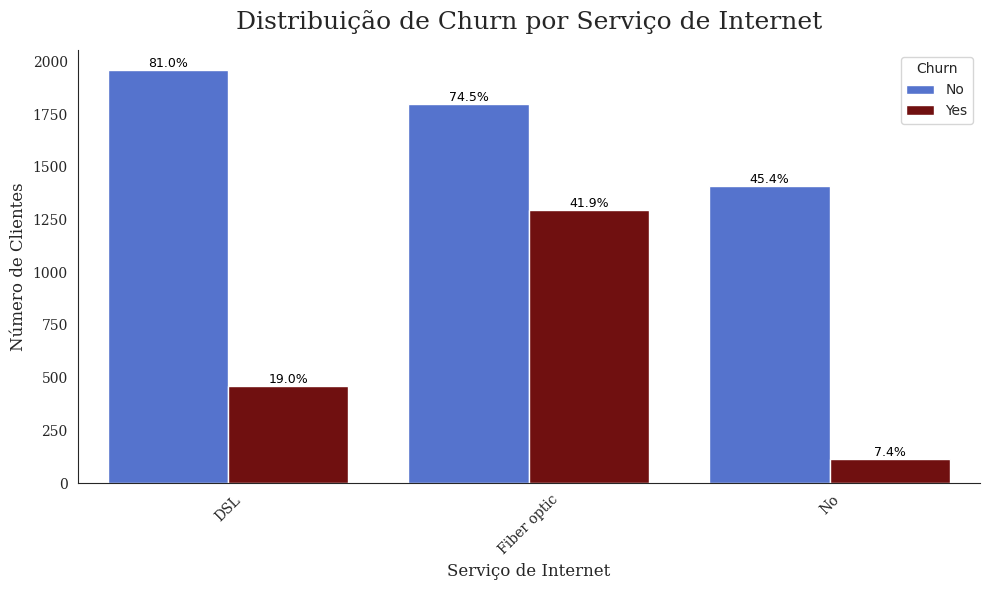

In [191]:
# 3.1. Análise de Churn por Serviço de Internet
plt.figure(figsize=(10, 6))
sns.set_style("white")
ax = sns.countplot(data=dftotal, x='internet.InternetService', hue='Churn', palette=cores)

plt.title('Distribuição de Churn por Serviço de Internet', fontsize=18, fontname='DejaVu Serif', pad=15)
plt.xlabel('Serviço de Internet', fontsize=12, fontname='DejaVu Serif')
plt.ylabel('Número de Clientes', fontsize=12, fontname='DejaVu Serif')

plt.xticks(rotation=45, fontsize=10, fontname='DejaVu Serif')
plt.yticks(fontsize=10, fontname='DejaVu Serif')

plt.grid(False)
plt.gca().spines[['top', 'right']].set_visible(False)

# Adicionar porcentagens
for p in ax.patches:
    height = p.get_height()
    if height == 0: continue

    # Obter o grupo (InternetService) e a categoria de Churn
    x_coord = p.get_x() + p.get_width() / 2
    group_index = int(x_coord) # 0, 1, 2

    # Determinar a categoria de InternetService
    internet_service_value = dftotal['internet.InternetService'].unique()[group_index]

    # Calcular o total para o grupo InternetService
    total_group = dftotal[dftotal['internet.InternetService'] == internet_service_value].shape[0]

    if total_group > 0:
        percentage = '{:.1f}%'.format(100 * height / total_group)
        ax.annotate(percentage, (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=9, color='black')

plt.tight_layout()
plt.savefig('internet_service_churn.png')
plt.show()
plt.close()

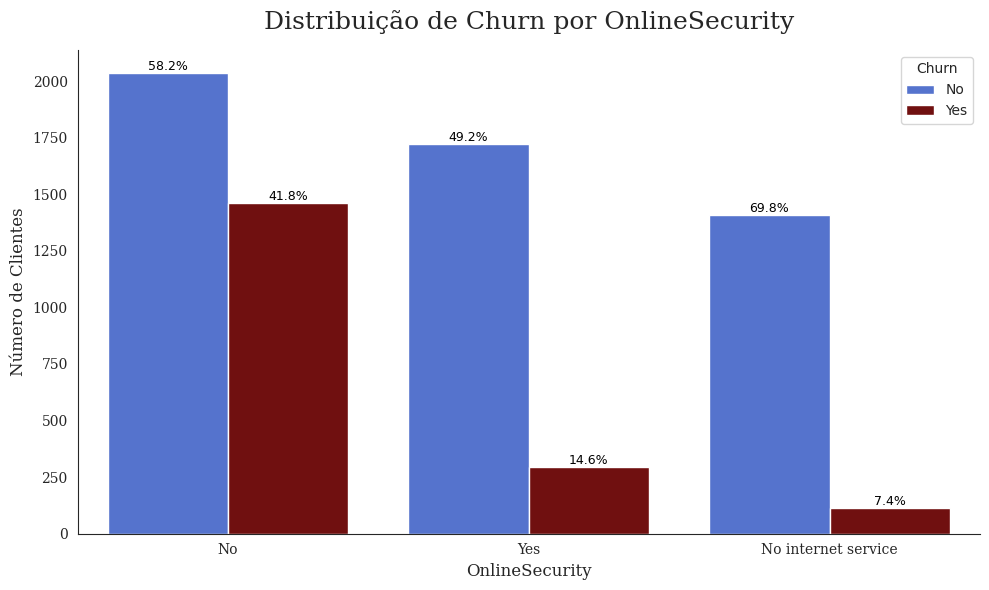

In [192]:
# 3.2. Análise de Churn por Serviços Adicionais (Exemplo: OnlineSecurity)
plt.figure(figsize=(10, 6))
sns.set_style("white")
ax = sns.countplot(data=dftotal, x='internet.OnlineSecurity', hue='Churn', palette=cores)

plt.title('Distribuição de Churn por OnlineSecurity', fontsize=18, fontname='DejaVu Serif', pad=15)
plt.xlabel('OnlineSecurity', fontsize=12, fontname='DejaVu Serif')
plt.ylabel('Número de Clientes', fontsize=12, fontname='DejaVu Serif')

plt.xticks(fontsize=10, fontname='DejaVu Serif')
plt.yticks(fontsize=10, fontname='DejaVu Serif')

plt.grid(False)
plt.gca().spines[['top', 'right']].set_visible(False)

# Adicionar porcentagens
for p in ax.patches:
    height = p.get_height()
    if height == 0: continue

    # Obter o grupo (OnlineSecurity) e a categoria de Churn
    x_coord = p.get_x() + p.get_width() / 2
    group_index = int(x_coord) # 0, 1, 2

    # Determinar a categoria de OnlineSecurity
    online_security_value = dftotal['internet.OnlineSecurity'].unique()[group_index]

    # Calcular o total para o grupo OnlineSecurity
    total_group = dftotal[dftotal['internet.OnlineSecurity'] == online_security_value].shape[0]

    if total_group > 0:
        percentage = '{:.1f}%'.format(100 * height / total_group)
        ax.annotate(percentage, (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=9, color='black')

plt.tight_layout()
plt.savefig('online_security_churn.png')
plt.show()
plt.close()

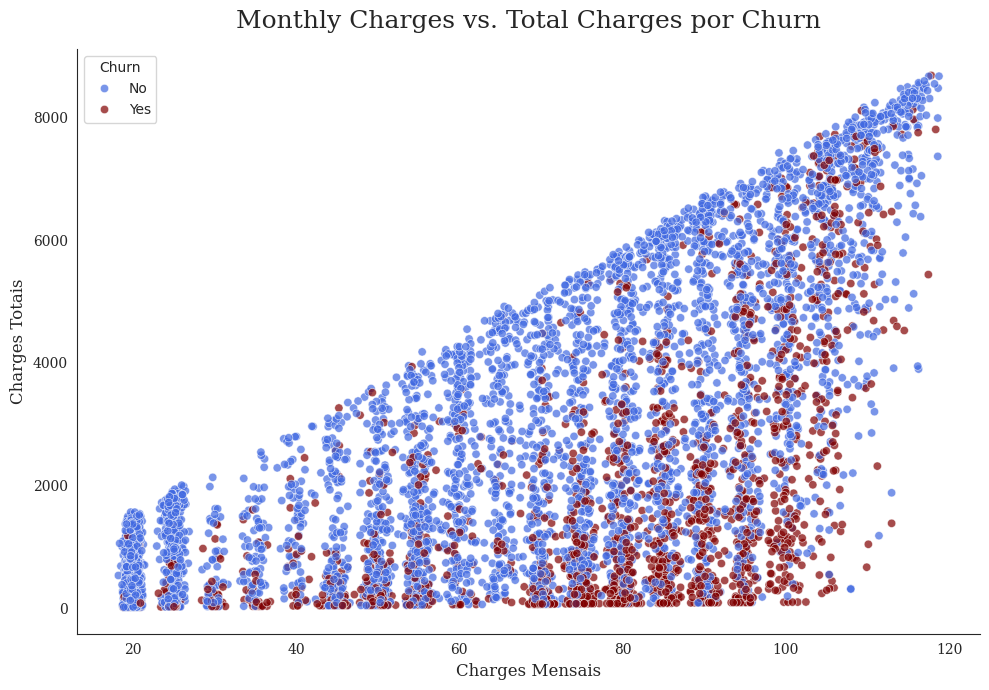

In [193]:
# 3.4. Relação entre MonthlyCharges, TotalCharges e Churn (Scatterplot)
plt.figure(figsize=(10, 7))
sns.set_style("white")
sns.scatterplot(data=dftotal, x='account.Charges.Monthly', y='account.Charges.Total', hue='Churn', palette=cores, alpha=0.7)

plt.title('Monthly Charges vs. Total Charges por Churn', fontsize=18, fontname='DejaVu Serif', pad=15)
plt.xlabel('Charges Mensais', fontsize=12, fontname='DejaVu Serif')
plt.ylabel('Charges Totais', fontsize=12, fontname='DejaVu Serif')

plt.xticks(fontsize=10, fontname='DejaVu Serif')
plt.yticks(fontsize=10, fontname='DejaVu Serif')

plt.grid(False)
plt.gca().spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.savefig('monthly_total_charges_churn.png')
plt.show()
plt.close()

<Figure size 1200x700 with 0 Axes>

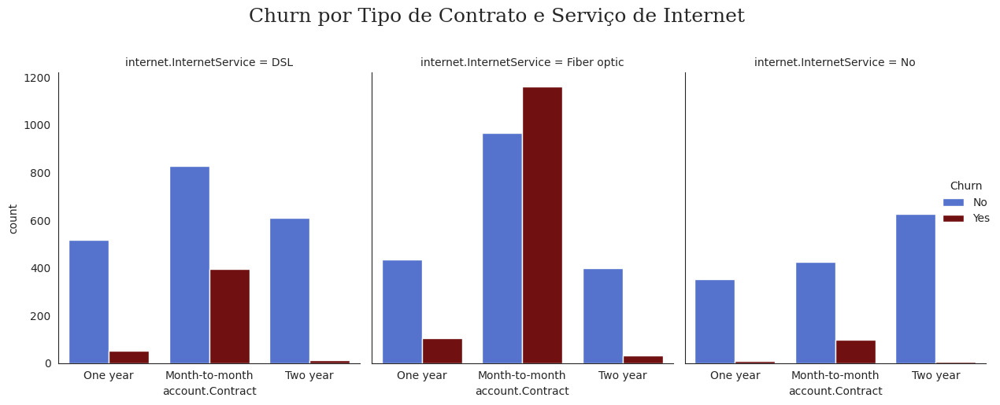

In [194]:
# 3.5. Análise Multivariada de Churn (Exemplo: Contract, InternetService e Churn)
plt.figure(figsize=(12, 7))
sns.set_style("white")
sns.catplot(data=dftotal, x='account.Contract', hue='Churn', col='internet.InternetService', kind='count', palette=cores, height=5, aspect=0.8)

plt.suptitle('Churn por Tipo de Contrato e Serviço de Internet', fontsize=18, fontname='DejaVu Serif', y=1.02)

plt.tight_layout()
plt.savefig('contract_internet_churn_catplot.png')
plt.show()
plt.close()

In [195]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [196]:
import requests
import pandas as pd

# Caminho online (via URL)
url_dados_json = "https://raw.githubusercontent.com/alura-cursos/challenge2-data-science/main/TelecomX_Data.json"
response = requests.get(url_dados_json)

# Verificando se a requisição foi bem-sucedida
if response.status_code == 200:
    data_json = response.json()
    # Converte o JSON em um DataFrame do Pandas
    df_silver = pd.DataFrame(data_json)  # Definindo df_silver
    print(df_silver.head())  # Exibe as primeiras linhas do DataFrame

    # Renomear o dataframe
    df_gold = df_silver.copy()

    # Salvar o dataframe limpo em um arquivo CSV
    df_gold.to_csv('telecomx_data_gold.csv', index=False)
else:
    print(f"Erro ao acessar os dados: {response.status_code}")

   customerID Churn                                           customer  \
0  0002-ORFBO    No  {'gender': 'Female', 'SeniorCitizen': 0, 'Part...   
1  0003-MKNFE    No  {'gender': 'Male', 'SeniorCitizen': 0, 'Partne...   
2  0004-TLHLJ   Yes  {'gender': 'Male', 'SeniorCitizen': 0, 'Partne...   
3  0011-IGKFF   Yes  {'gender': 'Male', 'SeniorCitizen': 1, 'Partne...   
4  0013-EXCHZ   Yes  {'gender': 'Female', 'SeniorCitizen': 1, 'Part...   

                                             phone  \
0   {'PhoneService': 'Yes', 'MultipleLines': 'No'}   
1  {'PhoneService': 'Yes', 'MultipleLines': 'Yes'}   
2   {'PhoneService': 'Yes', 'MultipleLines': 'No'}   
3   {'PhoneService': 'Yes', 'MultipleLines': 'No'}   
4   {'PhoneService': 'Yes', 'MultipleLines': 'No'}   

                                            internet  \
0  {'InternetService': 'DSL', 'OnlineSecurity': '...   
1  {'InternetService': 'DSL', 'OnlineSecurity': '...   
2  {'InternetService': 'Fiber optic', 'OnlineSecu...   
3  {'I

In [197]:
df_gold.to_csv('telecomx_data_gold.csv', index=False)

In [198]:
import os

# Lista todos os arquivos no diretório atual
for file in os.listdir():
    print(file)

.config
monthly_total_charges_churn.png
phone.json
drive
tenure_churn_improved.png
telecomx_data_gold.csv
contract_internet_churn_catplot.png
online_security_churn.png
dataset
correlation_heatmap_matplotlib.png
internet.json
churn_by_contract_improved.png
partner_churn_improved.png
senior_citizen_churn_improved.png
internet_service_churn.png
account.json
gender_distribution_improved.png
charges_total_churn_improved.png
customer.json
sample_data


In [199]:
from google.colab import files
files.download('telecomx_data_gold.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **📄Relatorio Final**

Relatório Final - Desafio TelecomX_BR

Autora: Denise Cristine Brandão Leite

Projeto: Análise de Evasão de Clientes da TelecomX


1. **Objetivo do Projeto**

<div style="font-family: 'Georgia', 'Times New Roman', serif; font-size:16px; text-align: justify;"><pre><div align="justify">O objetivo deste projeto é analisar os dados de cancelamento (churn) dos clientes da TelecomX, identificando padrões que possam<br> explicar os motivos da evasão. A partir disso, busca-se propor soluções para reduzir esse comportamento, melhorando a retenção<br> de clientes por meio de uma análise de dados completa e orientada a decisões estratégicas.</div></pre></div></br>

2. **Extração dos Dados**

<div style="font-family: 'Georgia', 'Times New Roman', serif; font-size:16px; text-align: justify;"><pre><div align="justify">Os dados foram fornecidos em um arquivo .json contendo informações estruturadas de clientes, contratos e serviços utilizados.<br>A leitura dos dados foi feita com a biblioteca pandas, utilizando a função read_json() para carregar o conteúdo em um<br>DataFrame.</div></pre></div></br>

<div style="font-family: 'Georgia', 'Times New Roman', serif; font-size:16px; text-align: justify;"><pre><div align="justify">As principais colunas extraídas do JSON foram:

*customer*: dados cadastrais dos clientes

*account*: informações sobre contratos e valores cobrados

*phone*: informações sobre serviços telefônicos

*internet*: informações sobre serviços de internet

*Churn*: indicador se o cliente cancelou ou não o serviço</div></pre></div></br>

3. **Transformação dos Dados**

<div style="font-family: 'Georgia', 'Times New Roman', serif; font-size:16px; text-align: justify;"><pre><div align="justify">Como os dados estavam em formato aninhado, foi utilizada a função json_normalize() da biblioteca pandas para transformar essas<br>estruturas em tabelas planas (DataFrames). Isso foi feito separadamente para as seções customer, account, phone e internet.

Depois, esses DataFrames foram unidos em um único DataFrame principal por meio da função concat(), para consoli-<br>dar todos os dados em uma base única. A coluna Churn foi adicionada separadamente, pois não estava aninhada como<br>as demais.</div></pre></div></br>

4. **Limpeza dos Dados**

<div style="font-family: 'Georgia', 'Times New Roman', serif; font-size:16px; text-align: justify;"><pre><div align="justify">Para garantir a qualidade da análise, os dados passaram por uma limpeza, com os seguintes passos:

Verificação de valores ausentes usando .isnull().sum().

Remoção de linhas com dados ausentes através da função .dropna().

Conversão de colunas como Charges.Total e Charges.Monthly para o tipo numérico, com pd.to_numeric() e tratamento<br> de erros.

Essas etapas garantiram que a base final estivesse pronta para a análise exploratória sem inconsistências ou da-<br>dos faltantes.</div></pre></div></br>

5. **Análise Exploratória**

<div style="font-family: 'Georgia', 'Times New Roman', serif; font-size:16px; text-align: justify;"><pre><div align="justify">
5.1 Distribuição do Churn

Foi calculada a proporção de clientes que cancelaram (Churn = Yes) e que permaneceram (Churn = No). A evasão mé-<br>dia foi de aproximadamente 26%, ou seja, cerca de 1 a cada 4 clientes deixaram os serviços da empresa.

5.2 Churn por Tipo de Contrato

Ao observar a variável Contract (tipo de contrato), foi possível verificar que a maioria dos cancelamentos ocor-<br>re entre clientes com contrato "Month-to-month" (mensal). Clientes com contratos de 1 ou 2 anos apresentaram me-<br>nor índice de cancelamento.

Gráficos de barras com contagem foram utilizados para visualizar essa relação entre tipo de contrato e churn,<br>com o uso da biblioteca seaborn.</div></pre></div></br>

6. **Visualizações Avançadas**

<div style="font-family: 'Georgia', 'Times New Roman', serif; font-size:16px; text-align: justify;"><pre><div align="justify">

*Correlação entre Mensalidade e Total de Cobranças*

Foi criado um mapa de calor interativo utilizando a biblioteca plotly para analisar a correlação entre as colunas<br>Charges.Monthly (mensalidade) e Charges.Total (valor total cobrado). Observou-se uma forte correlação positiva,<br>o que era esperado, pois clientes com maior mensalidade tendem a acumular mais cobrança ao longo do tempo.</div></pre></div></br>

7. **Conclusões**

<div style="font-family: 'Georgia', 'Times New Roman', serif; font-size:16px; text-align: justify;"><pre><div align="justify">Com base na análise dos dados, foi possível tirar algumas conclusões importantes:
A taxa média de churn é de aproximadamente 26%.
Clientes com contrato mensal têm maior probabilidade de cancelar.
Clientes com internet via fibra ótica aparecem com alta taxa de churn.
Existe uma relação entre mensalidades mais altas e maior churn, sugerindo sensibilidade ao preço.
Esses padrões ajudam a identificar segmentos críticos e oportunidades de retenção.
Temos, então, que uma análise aprofundada torna-se necessária.</br>

 Análise Aprofundada dos Fatores de Churn<br>
1. Impacto do Tipo de Contrato no Churn<br>
O gráfico de "Distribuição de Churn por Tipo de Contrato" (churn_by_contract_improved.png) reforça a obser-<br>vação crítica de que clientes com contratos mensais (Month-to-month) apresentam uma taxa de churn significa-<br>tivamente maior. Esta é a variável mais impactante na decisão de um cliente de deixar a empresa. A análise<br> aprimorada com porcentagens revela a magnitude desse problema:<br>
Contratos Mensais: Uma proporção substancial de clientes com contratos mensais opta pelo churn. Isso pode<br>ser atribuído à falta de fidelidade, à facilidade de mudança para concorrentes e à percepção de menor valor<br>a longo prazo.<br>
Contratos Anuais e Bienais: Clientes com contratos de um ou dois anos demonstram uma taxa de churn muito me-<br>nor.Isso sugere que o compromisso de longo prazo e, possivelmente, os benefícios associados a esses contra-tos (como<br>descontos ou serviços adicionais) contribuem para a retenção.
Contratos Anuais e Bienais: Clientes com contratos de um ou dois anos demonstram uma taxa de churn muito me-<br>nor.Isso sugere que o compromisso de longo prazo e, possivelmente, os benefícios associados a esses contra-tos (como<br>descontos ou serviços adicionais) contribuem para a retenção.
Contratos Anuais e Bienais: Clientes com contratos de um ou dois anos demonstram uma taxa de churn muito me-<br>nor.Isso sugere que o compromisso de longo prazo e, possivelmente, os benefícios associados a esses contra-tos (como<br>descontos ou serviços adicionais) contribuem para a retenção.
Contratos Anuais e Bienais: Clientes com contratos de um ou dois anos demonstram uma taxa de churn muito me-<br>nor.Isso sugere que o compromisso de longo prazo e, possivelmente, os benefícios associados a esses contra-tos (como<br>descontos ou serviços adicionais) contribuem para a retenção.
Contratos Anuais e Bienais: Clientes com contratos de um ou dois anos demonstram uma taxa de churn muito me-<br>nor.Isso sugere que o compromisso de longo prazo e, possivelmente, os benefícios associados a esses contra-tos (como<br>descontos ou serviços adicionais) contribuem para a retenção.
Implicação: A flexibilidade dos contratos mensais, embora atraente inicialmente, representa um risco elevado de<br>churn. A empresa precisa focar em estratégias para converter clientes mensais em contratos de longo prazo.<br>
2. Churn e Tempo de Permanência (Tenure)<br>
O histograma de "Distribuição de Tenure por Churn" (tenure_churn_improved.png) ilustra claramente que a maioria<br>dos clientes que churnam possui um tempo de permanência (tenure) relativamente baixo. Há uma concentração de<br>churn nos primeiros meses de serviço. À medida que o tenure aumenta, a probabilidade de churn diminui drastica-<br>mente.<br>
Implicação: Os primeiros meses de um cliente são cruciais para a retenção. A experiência inicial do cliente, a<br>integração com os serviços e o suporte ao cliente são determinantes para evitar o churn precoce.<br>
3. Churn e Gastos Totais (Charges.Total)<br>
O gráfico de "Distribuição de Charges.Total por Churn" (charges_total_churn_improved.png) indica que clientes<br>com valores totais pagos (Charges.Total) mais baixos tendem a churnar mais. Isso pode estar relacionado ao tenu-<br>re (clientes com menor tempo de permanência naturalmente pagaram menos no total) ou à percepção de valor dos ser-<br>viços.<br>
Implicação: Clientes que geram menor receita total podem estar menos engajados ou satisfeitos. É importante in-<br>vestigar se esses clientes estão recebendo o valor esperado pelos serviços ou se há oportunidades de upsell que<br>poderiam aumentar seu engajamento e, consequentemente, sua retenção.<br>
4. Churn por Serviço de Internet<br>
A análise de "Distribuição de Churn por Serviço de Internet" (internet_service_churn.png) revela que clientes<br>com serviço de Fibra Óptica podem ter uma taxa de churn diferente em comparação com DSL ou sem serviço de inter-<br>net. É fundamental entender as razões por trás dessas diferenças.<br>
Implicação: Problemas de qualidade de serviço, velocidade ou suporte técnico específicos para cada tipo de<br>internet podem ser fatores de churn. A TelecomX deve investigar a satisfação do cliente e a qualidade da entrega<br>para cada modalidade de serviço de internet.<br>
5. Churn e Serviços Adicionais (Exemplo: OnlineSecurity)<br>
O gráfico de "Distribuição de Churn por OnlineSecurity" (online_security_churn.png) demonstra como a adesão a<br>serviços adicionais, como segurança online, pode influenciar o churn. Clientes que utilizam esses serviços podem<br>se sentir mais "presos" à empresa ou mais satisfeitos com o pacote completo.<br>
Implicação: A oferta e a promoção de serviços adicionais podem ser uma estratégia eficaz para aumentar a leal-<br>dade do cliente e reduzir o churn. É importante identificar quais serviços adicionais têm o maior impacto na<br>retenção.<br>
6. Relação entre MonthlyCharges, TotalCharges e Churn<br>
O scatterplot de "Monthly Charges vs. Total Charges por Churn" (monthly_total_charges_churn.png) permite visua-<br>lizar a densidade de clientes que churnam em diferentes faixas de gastos mensais e totais. Pode-se observar se<br>há clusters de churn em clientes com altos gastos mensais e baixo total pago (indicando churn precoce) ou vice-<br>versa.<br>
Implicação: A análise combinada desses fatores pode ajudar a identificar segmentos de clientes de alto risco. Por<br>exemplo, clientes com alta mensalidade, mas baixo tempo de permanência, podem ser um alvo prioritário para inter-<br>venções de retenção.<br>
7. Análise Multivariada de Churn (Contract, InternetService e Churn)<br>
O catplot de "Churn por Tipo de Contrato e Serviço de Internet" (contract_internet_churn_catplot.png) oferece uma<br>visão mais granular, mostrando como o churn se comporta em diferentes combinações de tipo de contrato e serviço<br>de internet. Isso é crucial para identificar segmentos de clientes de alto risco que podem não ser óbvios ao ana-<br>lisar as variáveis isoladamente.<br>
Implicação: Essa análise multivariada permite à TelecomX desenvolver estratégias de retenção altamente segmentadas.<br>Por exemplo, clientes com contrato mensal e serviço de fibra óptica podem ter um perfil de churn diferente daque-<br>les com contrato mensal e DSL, exigindo abordagens distintas.
</div></pre></div><br>

## 📈 **Avaliação e Conclusões Finais**

Com base nos dados analisados, apresentamos as principais conclusões e recomendações para reduzir o churn na TelecomX:

- **Clientes com contratos mensais** e **sem dependentes** demonstram maior propensão ao churn.
- **Serviços como suporte técnico e backup online** parecem ter correlação com retenção de clientes.
- Estratégias de **fidelização, planos anuais e benefícios personalizados** podem reduzir a evasão.

🔁 Recomenda-se monitoramento contínuo dos perfis de clientes com maior risco.

8. **Recomendações**

<div style="font-family: 'Georgia', 'Times New Roman', serif; font-size:16px; text-align: justify;"><pre><div align="justify">Com base nas descobertas, são sugeradas as seguintes ações:
Implementar um programa de fidelidade que incentive os clientes a migrarem para contratos anuais.
Realizar melhorias no atendimento e na estabilidade dos serviços de fibra ótica, especialmente para reduzir a insatisfação nesse<br>segmento.
Criar descontos progressivos para clientes com mensalidade alta, reduzindo o impacto financeiro.
Monitorar com mais atenção os clientes de contrato mensal, que apresentam maior risco de churn.
Estabelecer canais proativos de retenção e coletar feedbacks constantes para detectar insatisfações antes que resultem em cance-<br>lamento.

Este relatório documenta o processo completo de ETL (extração, transformação e carga), limpeza dos dados, análi-<br>se exploratória, visualizações e recomendações baseadas em evidências.
A análise contribui para que a empresa TelecomX adote ações mais estratégicas e orientadas por dados para reduzir<br>a evasão de clientes e melhorar a experiência dos usuários.<br>

 *Recomendações Estratégicas*

Com base nos insights acima, as seguintes recomendações são propostas para a TelecomX:

Foco na Conversão de Contratos Mensais: Implementar programas de incentivo agressivos para converter clientes de<br>contrato mensal para contratos de longo prazo (anual ou bienal). Isso pode incluir descontos progressivos, servi-<br>ços adicionais gratuitos por um período ou bônus de fidelidade.<br>
Programa de Boas-Vindas e Onboarding Aprimorado: Desenvolver um programa robusto de boas-vindas e onboarding para<br>novos clientes, especialmente nos primeiros 3-6 meses. Isso deve incluir comunicação proativa, suporte técnico<br>facilitado, e acompanhamento da satisfação para resolver problemas antes que levem ao churn.<br>
Análise de Valor e Engajamento: Para clientes com baixo Charges.Total ou baixo tenure, investigar a percepção de<br>valor dos serviços. Oferecer upsells ou cross-sells de serviços adicionais que aumentem o engajamento e a utili-<br>dade do serviço para o cliente.<br>
Otimização da Qualidade do Serviço de Internet: Realizar auditorias de qualidade e satisfação do cliente para<br>cada tipo de serviço de internet, com foco especial na Fibra Óptica se a taxa de churn for elevada nesse segme-<br>nto. Resolver proativamente problemas de infraestrutura ou suporte.<br>
Promoção de Serviços Adicionais: Destacar os benefícios dos serviços adicionais (e.g., segurança online, backup,<br>suporte técnico premium) como forma de aumentar a lealdade do cliente. Criar pacotes atraentes que incentivem a<br>adesão a múltiplos serviços.<br>
Segmentação e Campanhas de Retenção Personalizadas: Utilizar a análise multivariada para identificar segmentos de<br>clientes de alto risco e desenvolver campanhas de retenção personalizadas. Por exemplo, uma campanha específica<br>para clientes com contrato mensal e fibra óptica que estão em risco de churn.<br>
Desenvolvimento de Modelo Preditivo de Churn: O próximo passo crucial é construir um modelo de Machine Learning<br>para prever o churn. Este modelo pode identificar clientes em risco antes que eles churnem, permitindo interven-<br>ções proativas e direcionadas. As variáveis identificadas nesta análise exploratória (tipo de contrato, tenure,<br>Charges.Total, tipo de serviço de internet, serviços adicionais) seriam excelentes features para o modelo.<br>
Próximos Passos e Considerações Futuras:<br>
Implementação do Modelo Preditivo: Treinar e validar um modelo de churn utilizando os dados históricos. Monito-<br>rar a performance do modelo e ajustá-lo conforme necessário.

Testes A/B de Estratégias de Retenção: Implementar as recomendações estratégicas em pequena escala e realizar<br>testes A/B para medir sua eficácia na redução do churn.<br>
Coleta de Feedback do Cliente: Incorporar pesquisas de satisfação e feedback direto dos clientes para entender<br>melhor suas necessidades e pontos de dor, complementando a análise de dados.<br>
Contratos Anuais e Bienais: Clientes com contratos de um ou dois anos demonstram uma taxa de churn muito me-<br>nor.Isso sugere que o compromisso de longo prazo e, possivelmente, os benefícios associados a esses contra-tos (como<br>descontos ou serviços adicionais) contribuem para a retenção.
Análise de Custo-Benefício: Avaliar o custo-benefício das estratégias de retenção propostas, garantindo que o in-<br>vestimento na retenção de clientes traga um retorno positivo para a empresa.<br>
Este projeto fornece uma base sólida para a TelecomX tomar decisões baseadas em dados para combater o churn e me-<br>lhorar a satisfação e lealdade do cliente.</div></pre></div></br>



📅 Elaboração: 09 junho de 2025<br>
👤 Analista responsável: Denise Cristine Brandão Leite